<a href="https://colab.research.google.com/github/Kenz2000/Projet-DATA2/blob/kenza_vf/classic4_bert_roberta.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Installation des librairies

In [ ]:
pip install gdown

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install ipython-autotime
%load_ext autotime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 438 µs (started: 2023-05-17 18:56:37 +00:00)


In [ ]:
pip install gensim

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 8.26 s (started: 2023-05-17 18:56:37 +00:00)


In [ ]:
pip install pandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 11.3 s (started: 2023-05-17 18:56:46 +00:00)


In [ ]:
pip install -U scikit-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 11 s (started: 2023-05-17 18:56:57 +00:00)


In [ ]:
pip install torch torchvision torchaudio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 7.86 s (started: 2023-05-17 18:57:08 +00:00)


In [ ]:
pip install tables

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 10.3 s (started: 2023-05-17 18:57:16 +00:00)


In [ ]:
pip install matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 10.6 s (started: 2023-05-17 18:57:26 +00:00)


In [ ]:
pip install transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 8.08 s (started: 2023-05-17 18:57:37 +00:00)


In [ ]:
pip install wordcloud

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 11 s (started: 2023-05-17 18:57:45 +00:00)


# Chargement des utilitaires

In [ ]:
! gdown 'https://drive.google.com/uc?id=1zTDcgnFtQWUeXgIce4O2Z2OPn0vJH1aD'

Downloading...
From: https://drive.google.com/uc?id=1zTDcgnFtQWUeXgIce4O2Z2OPn0vJH1aD
To: /content/utils_py.py
100% 6.69k/6.69k [00:00<00:00, 23.8MB/s]
time: 1.92 s (started: 2023-05-17 18:57:56 +00:00)


In [ ]:
%load_ext autotime

The autotime extension is already loaded. To reload it, use:
  %reload_ext autotime
time: 4.08 ms (started: 2023-05-17 18:57:58 +00:00)


# Chargement des données

In [ ]:
! gdown "https://drive.google.com/uc?id=1vKduM6oCoGWWiXZrn1P33rnu74YbJJ2T"

Downloading...
From: https://drive.google.com/uc?id=1vKduM6oCoGWWiXZrn1P33rnu74YbJJ2T
To: /content/classic4.csv
100% 5.02M/5.02M [00:00<00:00, 79.4MB/s]
time: 3.62 s (started: 2023-05-17 18:57:58 +00:00)


In [ ]:
from gensim.models import KeyedVectors
import pandas as pd
import numpy as np
import warnings
import re

from utils_py import static_document_embeddings, tokenize_re

/content/utils_py.py:167: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if len(sys.argv) is not 3:


time: 19.4 s (started: 2023-05-17 18:58:01 +00:00)


In [ ]:
df = pd.read_csv("./classic4.csv")
df
texts = df['text'].values
classic4_labels = df["label"].values
k_classic4 = len(df['label'].unique())
print(k_classic4)
df.info()

4
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7095 entries, 0 to 7094
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  7095 non-null   int64 
 1   text        7095 non-null   object
 2   label       7095 non-null   object
dtypes: int64(1), object(2)
memory usage: 166.4+ KB
time: 301 ms (started: 2023-05-17 18:58:21 +00:00)


### Bert

In [ ]:
! gdown "https://drive.google.com/uc?id=1-DAowc4ysRC9wDy60lzs8I6FIhLE4BEb"

Downloading...
From: https://drive.google.com/uc?id=1-DAowc4ysRC9wDy60lzs8I6FIhLE4BEb
To: /content/classic4_bert.h5
100% 262M/262M [00:03<00:00, 82.9MB/s]
time: 5.67 s (started: 2023-05-17 18:58:21 +00:00)


In [ ]:
classic4_bert = pd.read_hdf("classic4_bert.h5").to_numpy()

time: 2.31 s (started: 2023-05-17 18:58:27 +00:00)


### Roberta

In [ ]:
! gdown "https://drive.google.com/uc?id=1-ckFmuejFrNGx0mbhqwNIhewCeuOfGxs"

Downloading...
From: https://drive.google.com/uc?id=1-ckFmuejFrNGx0mbhqwNIhewCeuOfGxs
To: /content/classic4_roberta.h5
100% 262M/262M [00:02<00:00, 121MB/s]
time: 3.33 s (started: 2023-05-17 18:58:29 +00:00)


In [ ]:
classic4_roberta = pd.read_hdf("classic4_roberta.h5").to_numpy()

time: 3.45 s (started: 2023-05-17 18:58:33 +00:00)


#Autoencoder

In [ ]:
from torch.utils.data import DataLoader
import numpy as np
import torch
from tqdm import tqdm 

class AutoEncoder(torch.nn.Module):
    def __init__(self, input_dim, embedding_dim):
        super().__init__()
        self.input_dim = input_dim
        self.embedding_dim = embedding_dim

        self.encoder = torch.nn.Sequential(
            torch.nn.Linear(self.input_dim, 256),
            torch.nn.ReLU(),
            torch.nn.Linear(256, self.embedding_dim)
        )
        
        self.decoder = torch.nn.Sequential(
            torch.nn.Linear(self.embedding_dim, 256),
            torch.nn.ReLU(),
            torch.nn.Linear(256, self.input_dim),
            torch.nn.Sigmoid()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

def autoencoder(X, embedding_dim, n_epochs=50, batch_size=64, learning_rate=1e-3, weight_decay=1e-8, seed=None, return_model=False):
    if torch.cuda.is_available():
        device = 'cuda'
    else:
        device = 'cpu'

    if seed is not None:
      torch.manual_seed(seed)

    dataloader = DataLoader(dataset=X, batch_size=batch_size, shuffle=True)

    model = AutoEncoder(input_dim=X.shape[1], embedding_dim=embedding_dim)

    if device == 'cuda':
      model.cuda()

    loss_function = torch.nn.MSELoss()

    optimizer = torch.optim.Adam(model.parameters(),
                                lr=learning_rate,
                                weight_decay=weight_decay)

    losses = []

    model.train()
    for epoch in tqdm(range(n_epochs)):
        for batch in dataloader:
          batch = batch.to(device)
          reconstructed = model(batch)
          
          loss = loss_function(reconstructed, batch)
          
          optimizer.zero_grad()
          loss.backward()
          optimizer.step()
          
          losses.append(loss)

    model.eval()
    tensor_X = torch.tensor(X)
    tensor_X = tensor_X.to(device)
    encoded_X = model.encoder(tensor_X)
    encoded_X = encoded_X.detach().cpu().numpy()

    if return_model:
      return encoded_X, model, losses
    else:
      return encoded_X

time: 15.8 ms (started: 2023-05-17 18:58:36 +00:00)


# Importations

In [ ]:
pip install umap-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 11 s (started: 2023-05-17 18:58:36 +00:00)


In [ ]:
pip install hdbscan

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 10.3 s (started: 2023-05-17 18:58:47 +00:00)


In [ ]:
import hdbscan

time: 411 ms (started: 2023-05-17 18:58:57 +00:00)


In [ ]:
from sklearn.cluster import KMeans ,AgglomerativeClustering, SpectralClustering
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
import numpy as np
from sklearn.metrics.cluster import normalized_mutual_info_score, adjusted_rand_score
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from umap import UMAP
from utils_py import accuracy


time: 25.7 s (started: 2023-05-17 18:58:58 +00:00)


# Fonctions utilitaires

In [ ]:
def map_labels(labels):
    mapping = {}
    for (i,name) in enumerate(set(labels)):
        mapping[name] = i
    return [mapping[letter] for letter in labels]

time: 832 µs (started: 2023-05-17 18:59:24 +00:00)


In [ ]:
def eval_clustering_2D(x, labels, pred_labels, methods):
    fig, axes = plt.subplots(int((len(pred_labels)+1)/3) if not (len(pred_labels)+1)%3 else int((len(pred_labels)+1)/3+1) , 3, figsize=(20,25))
    axes = [item for sublist in axes for item in sublist]
    axes[0].scatter(x[:,0], x[:,1],
                    c=labels, edgecolor='none', alpha=1,)
    axes[0].title.set_text('Real Labels')
    results = {}
    for i in range(len(pred_labels)):
        nmi = normalized_mutual_info_score(labels, pred_labels[i])
        ari = adjusted_rand_score(labels, pred_labels[i])
        acc = accuracy(labels, pred_labels[i])
        results[methods[i]] = (nmi,ari,acc)
        axes[i+1].scatter(x[:,0], x[:,1],
                    c=pred_labels[i], edgecolor='none', alpha=1,)
        axes[i+1].title.set_text(f'{methods[i]}\nNMI = {nmi}\nARI={ari}\nAcc={acc}')
    plt.show()
    return results
    

time: 1.6 ms (started: 2023-05-17 18:59:24 +00:00)


In [ ]:
def run_clustering(X, k, labels, spectral=False):
    kmeans_labels = KMeans(k, random_state=42).fit(X).labels_
    hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X).labels_
    cah_labels_ward = AgglomerativeClustering(n_clusters=k).fit_predict(X)
    cah_labels_complete = AgglomerativeClustering(n_clusters=k, linkage="complete").fit_predict(X)
    cah_labels_average = AgglomerativeClustering(n_clusters=k, linkage="average").fit_predict(X)
    cah_labels_single = AgglomerativeClustering(n_clusters=k, linkage="single").fit_predict(X)
    gaussian = GaussianMixture(n_components=k, random_state=42).fit_predict(X)
    
    if spectral:
        spectral_labels = SpectralClustering(k, assign_labels="discretize", random_state=42).fit(X).labels_
        return eval_clustering_2D(X, labels, [kmeans_labels, spectral_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single, gaussian], ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)", "MMG"])

    else:
        return eval_clustering_2D(X, labels, [kmeans_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single, gaussian], ["Kmeans", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)", "MMG"])

time: 1.49 ms (started: 2023-05-17 18:59:24 +00:00)


In [ ]:
methods = ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)"]
methods_noSpec = ["Kmeans", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)"]

time: 5.26 ms (started: 2023-05-17 18:59:24 +00:00)


In [ ]:
results_classic4_bert_redim= {}
results_classic4_roberta_redim = {}

time: 4.87 ms (started: 2023-05-17 18:59:24 +00:00)


#La représentation BERT

## Espace original

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(classic4_bert)
kmeans_labels = KMeans(k_classic4, random_state=42).fit(classic4_bert).labels_
# spectral_labels = SpectralClustering(k_classic4, n_components= classic4_bert.shape[1], assign_labels="discretize", random_state=42).fit(classic4_bert).labels_
#hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(classic4_bert).labels_
cah_labels_ward = AgglomerativeClustering(n_clusters=k_classic4).fit_predict(classic4_bert)
cah_labels_complete = AgglomerativeClustering(n_clusters=k_classic4, linkage="complete").fit_predict(classic4_bert)
cah_labels_average = AgglomerativeClustering(n_clusters=k_classic4, linkage="average").fit_predict(classic4_bert)
cah_labels_single = AgglomerativeClustering(n_clusters=k_classic4, linkage="single").fit_predict(classic4_bert)
#gaussian = GaussianMixture(n_components=k_classic4, random_state=42).fit_predict(classic4_bert)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


time: 18min 53s (started: 2023-05-17 18:59:24 +00:00)


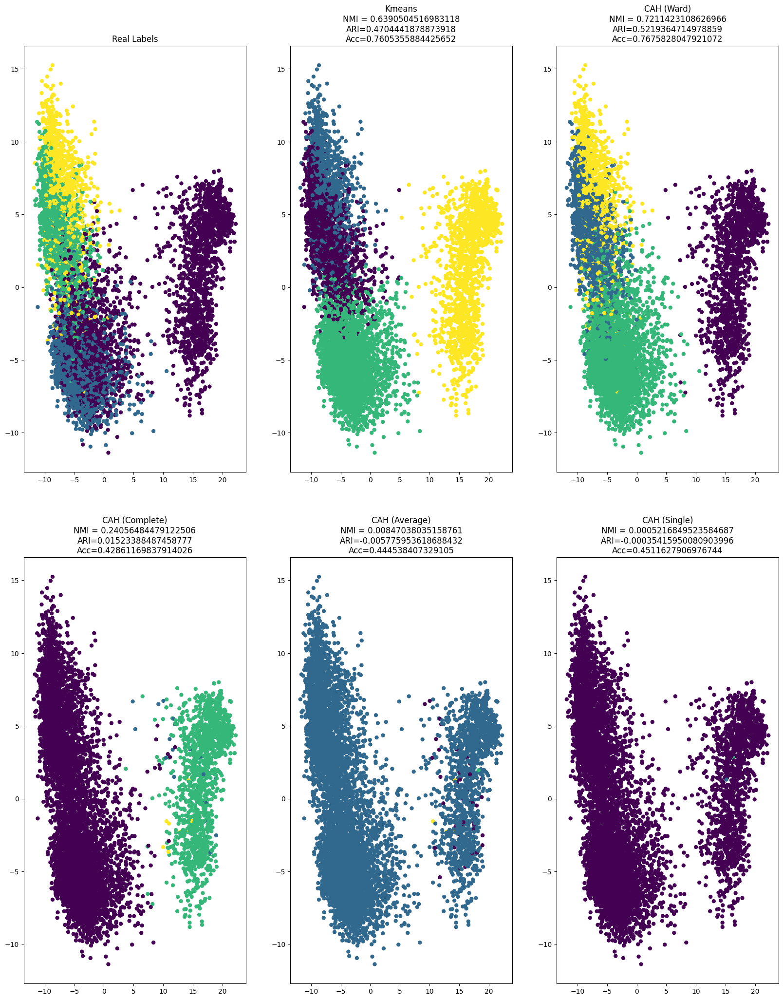

time: 1.92 s (started: 2023-05-17 19:28:59 +00:00)


In [ ]:
results_classic4_bert_redim["original"] = eval_clustering_2D(X_reduced, map_labels(classic4_labels), [kmeans_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single], ["Kmeans", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)"])

Les résultats obtenus indiquent que la plupart des méthodes de clustering utilisées ne parviennent pas à discriminer de manière significative les classes dans leur espace d'origine, avec des scores d'estimation de similarité des étiquettes (ARI) proches de 0 ou inférieurs. Bien que les modèles Kmeans, CAH(Ward)  obtiennent de meilleurs résultats que les autres modèles, ils ne permettent toujours pas de tirer des interprétations significatives. Par ailleurs, il est important de noter que l'accuracy  n'est pas la métrique la plus appropriée pour évaluer la performance des classificateurs, car elle est influencée par la prédominance de la classe "cacm" en termes de nombre d'individus.

## Espace réduit (approche tandem)

### PCA avec 2 composantes

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


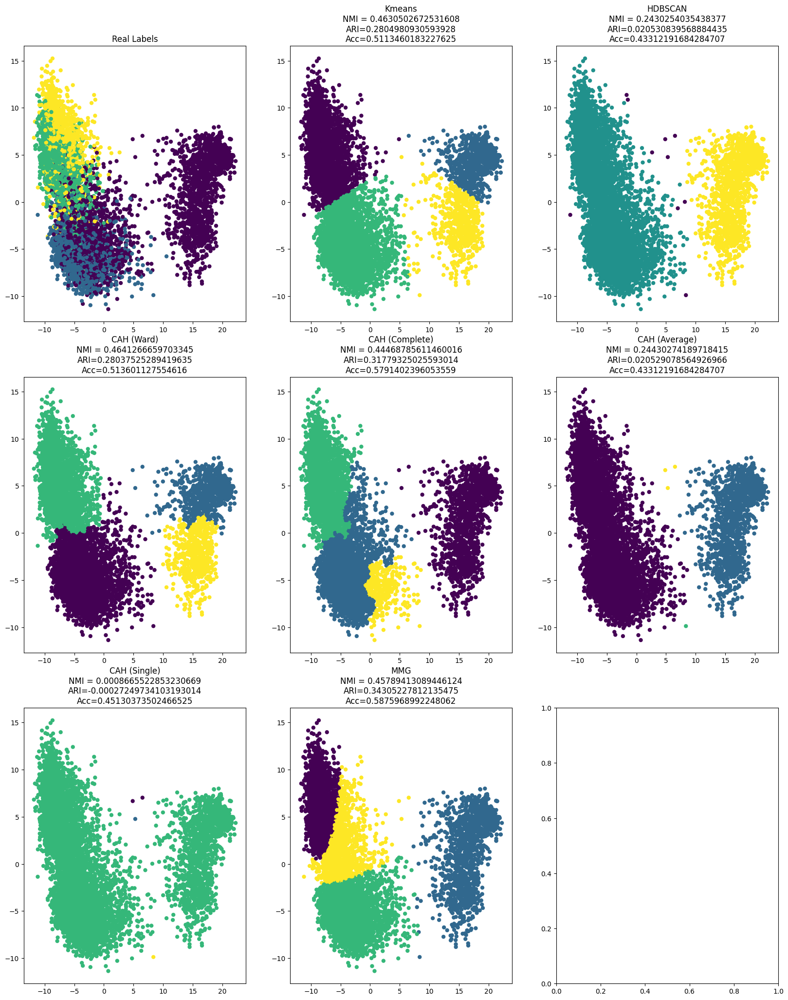

time: 15 s (started: 2023-05-17 19:29:12 +00:00)


In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(classic4_bert)
results_classic4_bert_redim['pca2'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

### PCA avec 20 composantes

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


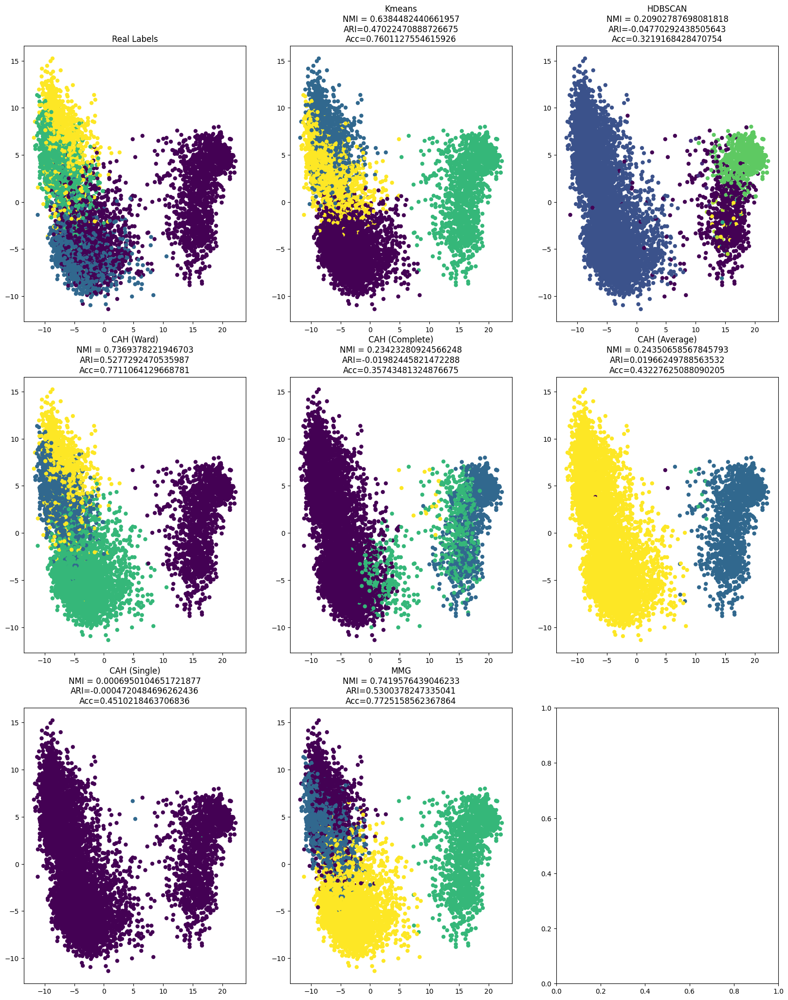

time: 21.7 s (started: 2023-05-17 19:29:27 +00:00)


In [ ]:
X_reduced = PCA(n_components=20, random_state=42).fit_transform(classic4_bert)
results_classic4_bert_redim['pca20'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

Nous pouvons classer les algorithmes en deux catégories : ceux qui fournissent des résultats moyens et ceux dont les résultats sont non significatif:
Résultats moyens : Kmeans, CAH(Ward), et MMG , leurs resultats sont tres proches. Leurs resultats sont boustes en augmentant le nombre de composantes de l'ACP et ils arrivent a avoir une accuracy de 77%.
Resultats non significatifs: HDBSCAN, CAH(Average), et CAH(Single) ,CAH(complete) ont une ARI tres proche de 0 donc leurs resultats sont non significatifs.
Le meilleur modèle est MMG sous 20 composantes qui a une NMI de 74%, une ARI de 53% et une accuracy de 77%.

### TSNE avec 2 composantes

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


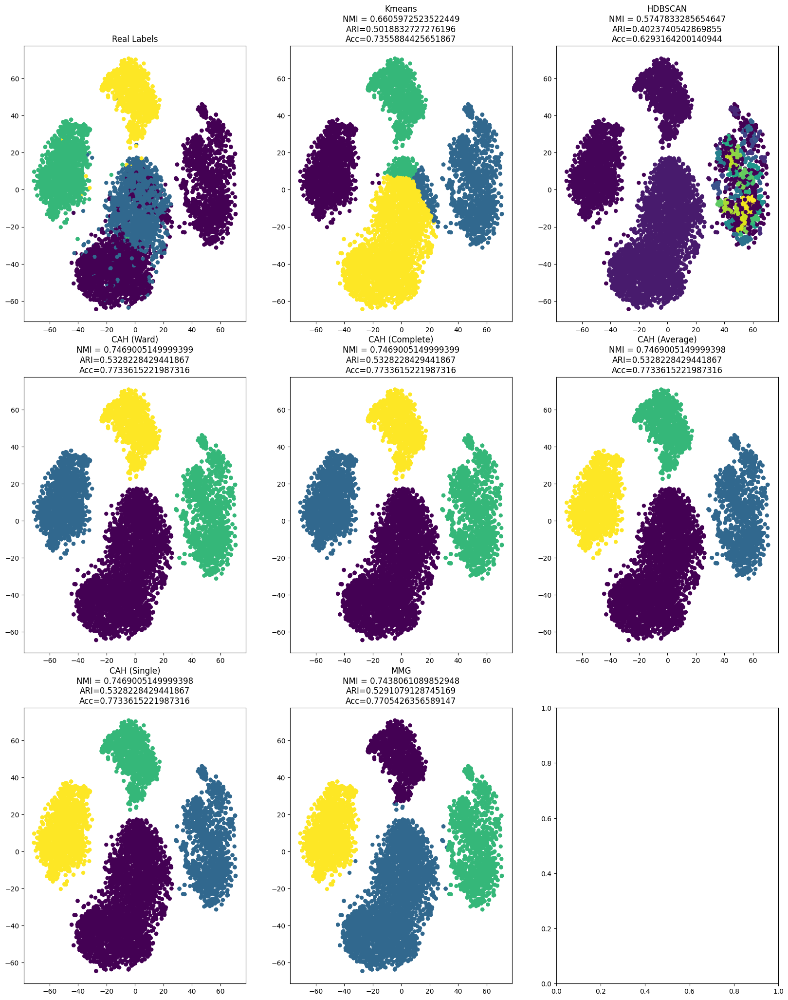

time: 2min 23s (started: 2023-05-17 19:29:48 +00:00)


In [ ]:
X_reduced_tsne = TSNE(n_components=2, random_state=42).fit_transform(classic4_bert)
results_classic4_bert_redim['tsne'] = run_clustering(X_reduced_tsne, k_classic4, map_labels(classic4_labels))

L'application de tSNE aux données a considérablement amélioré les performances de tous les modèles, rendant les classes plus faciles à séparer dans cet espace. Cependant, la différence de performance entre les projections PCA et tSNE varie selon les modèles.

Plus précisément, l'application de tSNE a significativement amélioré les performances des modèles HDBScan, CAH(Single-Min) et CAH(Average), avec une augmentation notable du NMI. Parmi ces modèles, le lien minimum (CAH(Single-Minimum)) se distingue en obtenant le meilleur NMI, étant le seul modèle capable de comprendre que les conglomérats supérieur et inférieur appartiennent à la même classe.

L'espace tSNE a également amélioré les performances des modèles Kmeans, CAH(Ward) et MMG, mais de manière moins significative que pour les autres modèles. Ces modèles présentent une accuracy identique de 77%. Si l'on utilise le NMI pour comparer les modèles, on peut observer que le modèle CAH(Single-Minimum) se positionne légèrement devant MMG.  

### UMAP avec 2 composantes

In [ ]:
X_reduced = UMAP(n_components=2, random_state=42).fit_transform(classic4_bert)

time: 58.5 s (started: 2023-05-17 19:32:12 +00:00)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


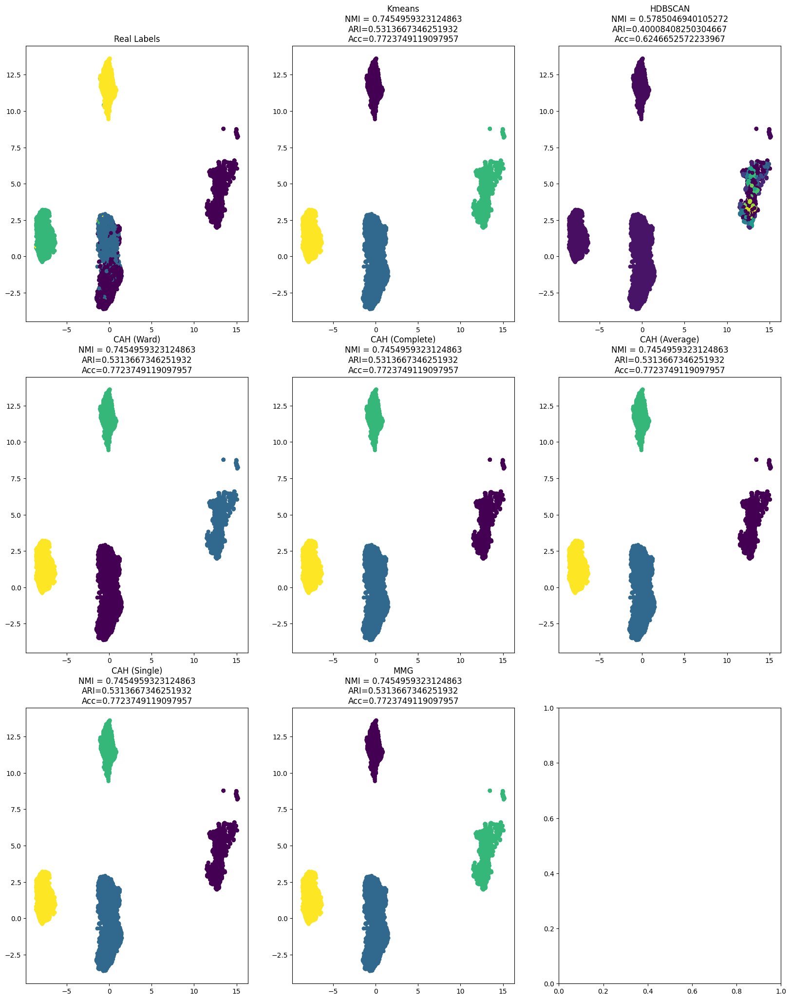

time: 10.5 s (started: 2023-05-17 19:33:11 +00:00)


In [ ]:
results_classic4_bert_redim['umap'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

### UMAP avec 20 composantes

In [ ]:
X_reduced = UMAP(n_components=20, random_state=42).fit_transform(classic4_bert)

time: 47.6 s (started: 2023-05-17 19:33:21 +00:00)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


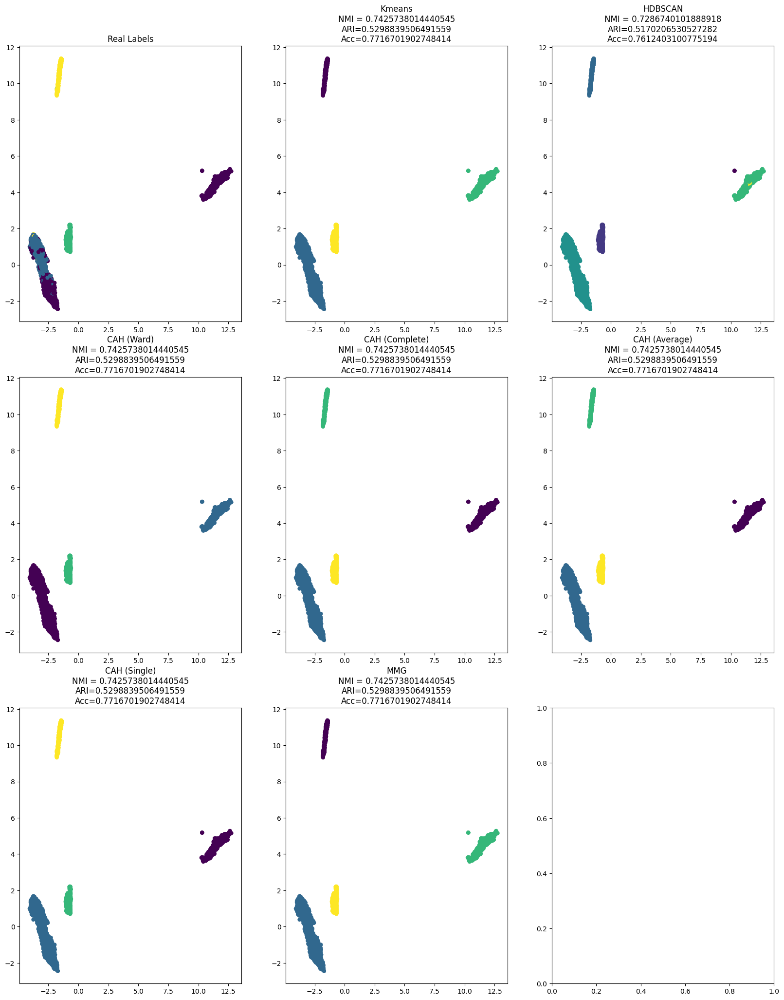

time: 13.1 s (started: 2023-05-17 19:34:09 +00:00)


In [ ]:
results_classic4_bert_redim['umap20'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

L'utilisation de l'UMAP pour créer un espace à partir des données a considérablement amélioré les performances de tous les modèles. Dans cet espace, il est facile de séparer la plupart des classes.

Nous constatons que tous les modèles convergent vers un modèle similaire qui parvient à classifier correctement 3 classes sur 5, mais qui échoue complètement à identifier la classe qui se chevauche. L'exactitude globale est de 77% avec un ARI de 52%.

### Autoencodeur avec 2 composantes

Je tiens à souligner qu'après la première exécution du code, l'autocodeur a provoqué un plantage de mon environnement, ce qui a nécessité de le commenter. Par conséquent, j'ai interprété les résultats obtenus lors de la première tentative sans inclure l'autocodeur dans l'analyse ultérieure.

Kenza SAHI

In [ ]:
'''n_components=2
X_reduced = autoencoder(classic4_bert.astype("float32"), n_components, seed=42, learning_rate=1e-3)'''

'n_components=2\nX_reduced = autoencoder(classic4_bert.astype("float32"), n_components, seed=42, learning_rate=1e-3)'

time: 6.65 ms (started: 2023-05-17 19:34:22 +00:00)


In [ ]:
'''results_classic4_bert_redim['autoencoder'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))'''

"results_classic4_bert_redim['autoencoder'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))"

time: 3.93 ms (started: 2023-05-17 19:34:22 +00:00)


Selon les résultats de l'application des différentes méthodes de classification sur l'espace généré par l'autoencodeur, nous pouvons observer que les classes sont plus difficiles à classifier dans cet espace car elles se chevauchent.

Les modèles qui se démarquent sont Kmeans, CAH(Average), CAH(Ward) et MMG. Ils ont tous des valeurs de NMI et d'ARI proches, ainsi qu'une précision comprise entre 58% et 64%.

###Interprétations des resultats 

In [ ]:
from copy import deepcopy
results_temp = deepcopy(results_classic4_bert_redim)
for method in results_temp:
    for result in results_temp[method]:
        nmi, ari, acc = results_temp[method][result]
        results_temp[method][result] = {
            'nmi': nmi,
            "ari": ari,
            'acc': acc
        }

time: 1.52 ms (started: 2023-05-17 19:34:22 +00:00)


In [ ]:
results_bert_classic4 = pd.DataFrame.from_dict({(i,j): results_temp[i][j] 
                           for i in results_temp.keys() 
                           for j in results_temp[i].keys()},
                       orient='index')

time: 19.2 ms (started: 2023-05-17 19:34:22 +00:00)


In [ ]:
results_bert_classic4

nmi       ari       acc
original Kmeans          0.639050  0.470444  0.760536
         CAH (Ward)      0.721142  0.521936  0.767583
         CAH (Complete)  0.240565  0.015234  0.428612
         CAH (Average)   0.008470 -0.005776  0.444538
         CAH (Single)    0.000522 -0.000354  0.451163
pca2     Kmeans          0.463050  0.280498  0.511346
         HDBSCAN         0.243025  0.020531  0.433122
         CAH (Ward)      0.464127  0.280375  0.513601
         CAH (Complete)  0.444688  0.317793  0.579140
         CAH (Average)   0.244303  0.020529  0.433122
         CAH (Single)    0.000867 -0.000272  0.451304
         MMG             0.457894  0.343052  0.587597
pca20    Kmeans          0.638448  0.470225  0.760113
         HDBSCAN         0.209028 -0.047703  0.321917
         CAH (Ward)      0.736938  0.527729  0.771106
         CAH (Complete)  0.234233 -0.019824  0.357435
         CAH (Average)   0.243507  0.019662  0.432276
         CAH (Single)    0.000695 -0.000472  0.451022
         MMG             0.741958  0.530038  0.772516
tsne     Kmeans          0.660597  0.501883  0.735588
         HDBSCAN         0.574783  0.402374  0.629316
         CAH (Ward)      0.746901  0.532823  0.773362
         CAH (Complete)  0.746901  0.532823  0.773362
         CAH (Average)   0.746901  0.532823  0.773362
         CAH (Single)    0.746901  0.532823  0.773362
         MMG             0.743806  0.529108  0.770543
umap     Kmeans          0.745496  0.531367  0.772375
         HDBSCAN         0.578505  0.400084  0.624665
         CAH (Ward)      0.745496  0.531367  0.772375
         CAH (Complete)  0.745496  0.531367  0.772375
         CAH (Average)   0.745496  0.531367  0.772375
         CAH (Single)    0.745496  0.531367  0.772375
         MMG             0.745496  0.531367  0.772375
umap20   Kmeans          0.742574  0.529884  0.771670
         HDBSCAN         0.728674  0.517021  0.761240
         CAH (Ward)      0.742574  0.529884  0.771670
         CAH (Complete)  0.742574  0.529884  0.771670
         CAH (Average)   0.742574  0.529884  0.771670
         CAH (Single)    0.742574  0.529884  0.771670
         MMG             0.742574  0.529884  0.771670

time: 29.4 ms (started: 2023-05-17 19:34:22 +00:00)


In [ ]:
metric = "ari"
results_bert_classic4[results_bert_classic4[metric] == results_bert_classic4[metric].max()]

nmi       ari       acc
tsne CAH (Ward)      0.746901  0.532823  0.773362
     CAH (Complete)  0.746901  0.532823  0.773362
     CAH (Average)   0.746901  0.532823  0.773362
     CAH (Single)    0.746901  0.532823  0.773362

time: 13.3 ms (started: 2023-05-17 19:34:22 +00:00)


In [ ]:
metric = "nmi"
results_bert_classic4[results_bert_classic4[metric] == results_bert_classic4[metric].max()]

nmi       ari       acc
tsne CAH (Ward)      0.746901  0.532823  0.773362
     CAH (Complete)  0.746901  0.532823  0.773362

time: 16.4 ms (started: 2023-05-17 19:34:22 +00:00)


In [ ]:
metric = "acc"
best_bert_classic4 = results_bert_classic4[results_bert_classic4[metric] == results_bert_classic4[metric].max()]
best_bert_classic4

nmi       ari       acc
tsne CAH (Ward)      0.746901  0.532823  0.773362
     CAH (Complete)  0.746901  0.532823  0.773362
     CAH (Average)   0.746901  0.532823  0.773362
     CAH (Single)    0.746901  0.532823  0.773362

time: 14.2 ms (started: 2023-05-17 19:34:22 +00:00)


Le modèle qui a obtenu les meilleurs résultats est le CAH (Ward) avec la méthode de réduction de dimension t-SNE, ce qui n'est pas surprenant.

In [ ]:
X_reduced_best = TSNE(n_components=2, random_state=42).fit_transform(classic4_bert)
best_labels = AgglomerativeClustering(n_clusters=k_classic4).fit_predict(X_reduced_best)

time: 2min (started: 2023-05-17 19:34:22 +00:00)


In [ ]:
from wordcloud import WordCloud, STOPWORDS
def print_wordcloud(X, labels):
    temp_df = pd.DataFrame({
        "text": X,
        "labels": labels
    })
    for label in temp_df['labels'].unique():
        alltext = ' '.join(temp_df[temp_df['labels']== label]['text'])
        wordcloud = WordCloud().generate(alltext)
        # Display the generated image:
        print(f'Class: {label}')
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()
        print(f'\n')

time: 66.9 ms (started: 2023-05-17 19:36:23 +00:00)


Class: 0


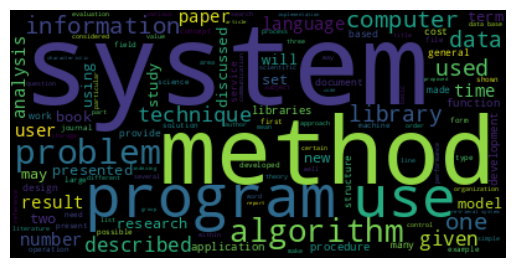



Class: 2


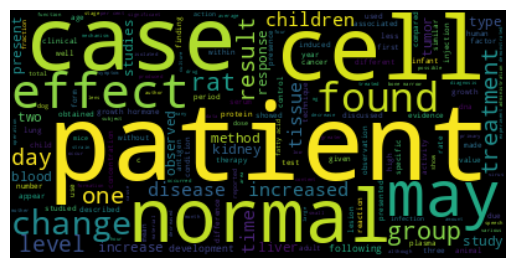



Class: 1


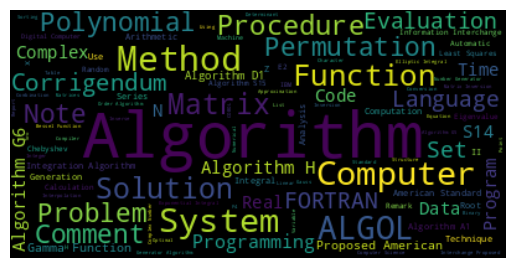



Class: 3


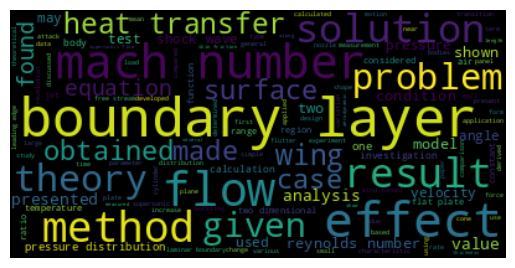



time: 5.86 s (started: 2023-05-17 19:36:23 +00:00)


In [ ]:
print_wordcloud(df['text'].values, best_labels)

Class: cacm


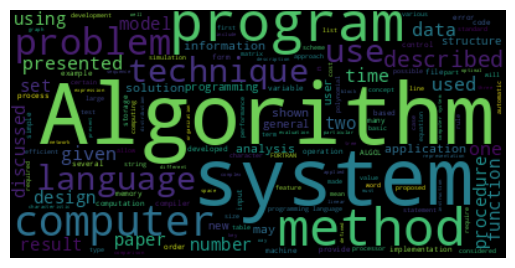



Class: cisi


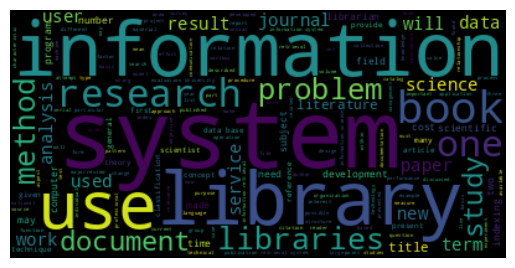



Class: med


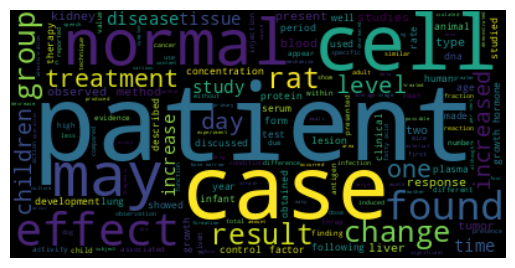



Class: cran


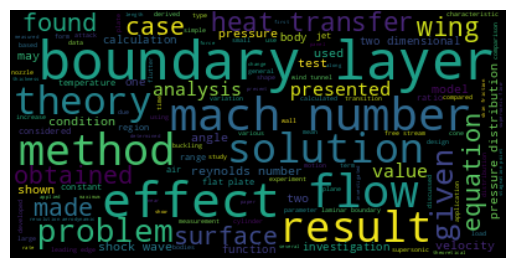



time: 5.75 s (started: 2023-05-17 19:36:29 +00:00)


In [ ]:
print_wordcloud(df['text'].values, df['label'].values)

En analysant les nuages de mots et en les comparant, nous pouvons identifier les classes prédites comme suit : la classe 0 est un mélange des classes "cacm" et "cisi" car elles partagent des termes fréquents similaires, la classe 1 correspond approximativement à la classe "cran" en raison de la similarité des termes les plus fréquents, la classe 2 est un outlier probablement lié à la classe 0, et la classe 3 est approximativement la classe "med" en raison de la présence de termes fréquents communs.


# La représentation ROBERTA

## Espace Original

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(classic4_roberta)
kmeans_labels = KMeans(k_classic4, random_state=42).fit(classic4_roberta).labels_
# spectral_labels = SpectralClustering(k_classic4, n_components= classic4_roberta.shape[1], assign_labels="discretize", random_state=42).fit(classic4_roberta).labels_
#hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(classic4_roberta).labels_
cah_labels_ward = AgglomerativeClustering(n_clusters=k_classic4).fit_predict(classic4_roberta)
cah_labels_complete = AgglomerativeClustering(n_clusters=k_classic4, linkage="complete").fit_predict(classic4_roberta)
cah_labels_average = AgglomerativeClustering(n_clusters=k_classic4, linkage="average").fit_predict(classic4_roberta)
cah_labels_single = AgglomerativeClustering(n_clusters=k_classic4, linkage="single").fit_predict(classic4_roberta)
#gaussian = GaussianMixture(n_components=k_classic4, random_state=42).fit_predict(classic4_roberta)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


time: 18min 10s (started: 2023-05-17 20:44:39 +00:00)


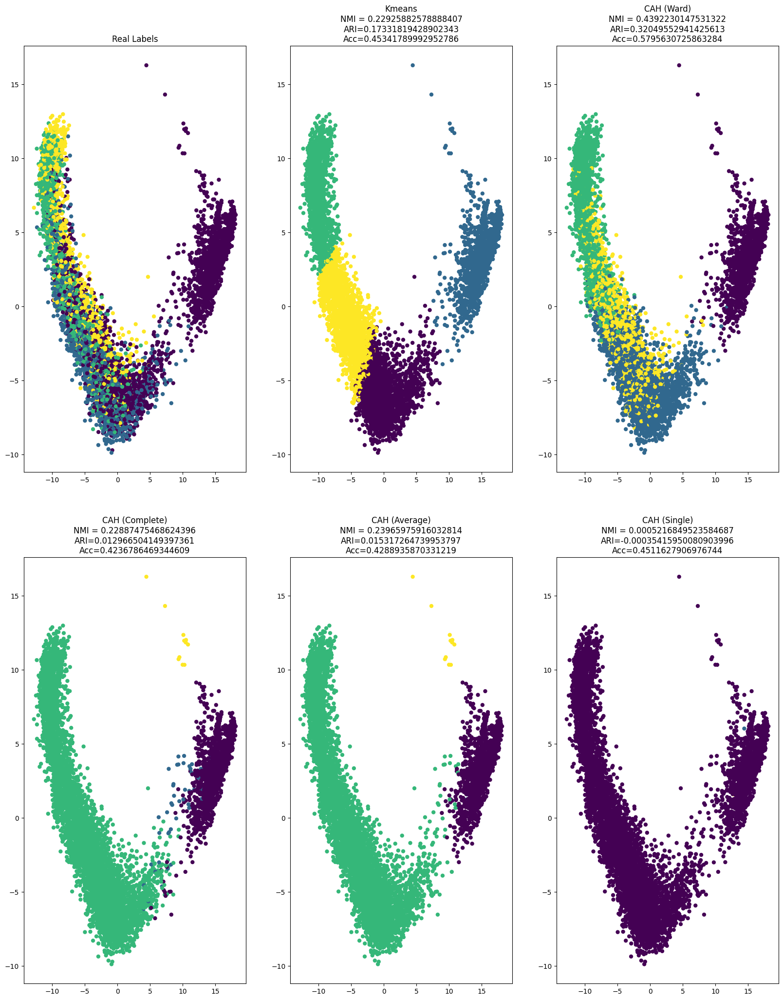

time: 1.81 s (started: 2023-05-17 21:03:20 +00:00)


In [ ]:
results_classic4_roberta_redim["original"] = eval_clustering_2D(X_reduced, map_labels(classic4_labels), [kmeans_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single], ["Kmeans", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)"])

Les résultats obtenus révèlent que les différentes méthodes de clustering utilisées ne parviennent pas à séparer efficacement les classes dans leur espace d'origine, avec la plupart des estimations d'étiquettes se rapprochant d'une attribution aléatoire (ARI proche de 0 ou inférieur à 0). Il est intéressant de noter que les modèles Kmeans, CAH(Ward) obtiennent de meilleurs résultats que les autres modèles, mais ne présentent toujours pas d'amélioration significative permettant de faciliter les interprétations.

Par ailleurs, il est important de souligner que l'accuracy n'est pas la meilleure métrique pour évaluer la performance des classificateurs, car la classe "cacm" compte le plus grand nombre d'individus.

## Espace réduit (Approche tandem)

### PCA avec 2 composantes

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


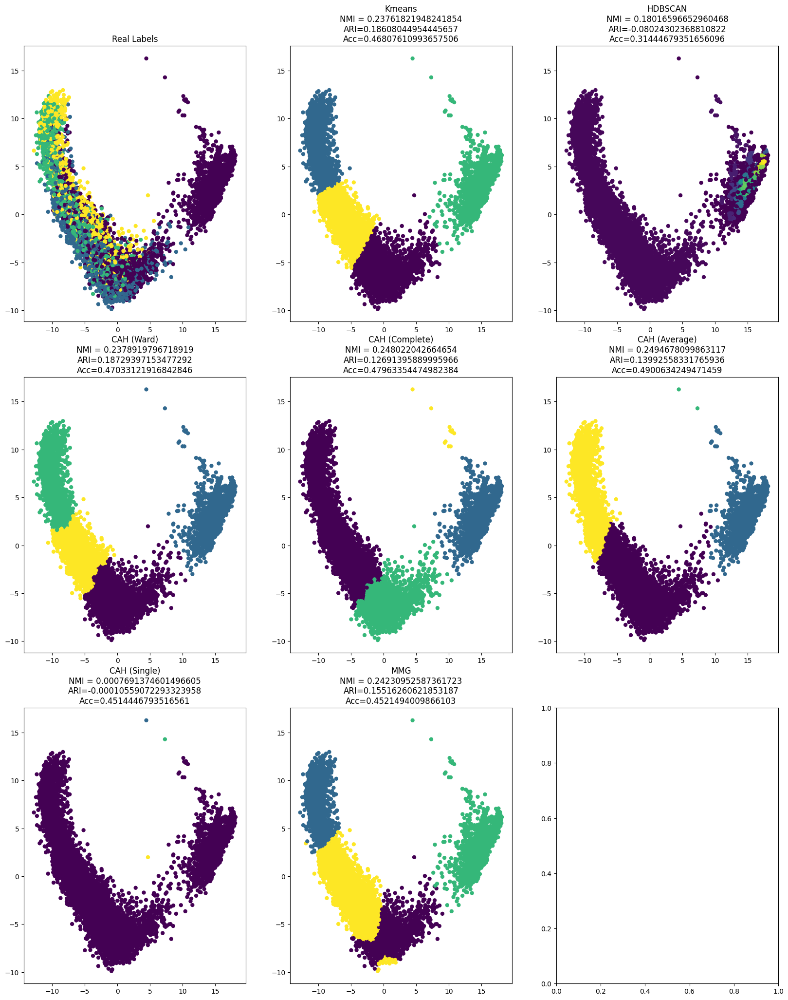

time: 14.5 s (started: 2023-05-17 21:04:19 +00:00)


In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(classic4_roberta)
results_classic4_roberta_redim['pca2'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

### PCA avec 20 composantes

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


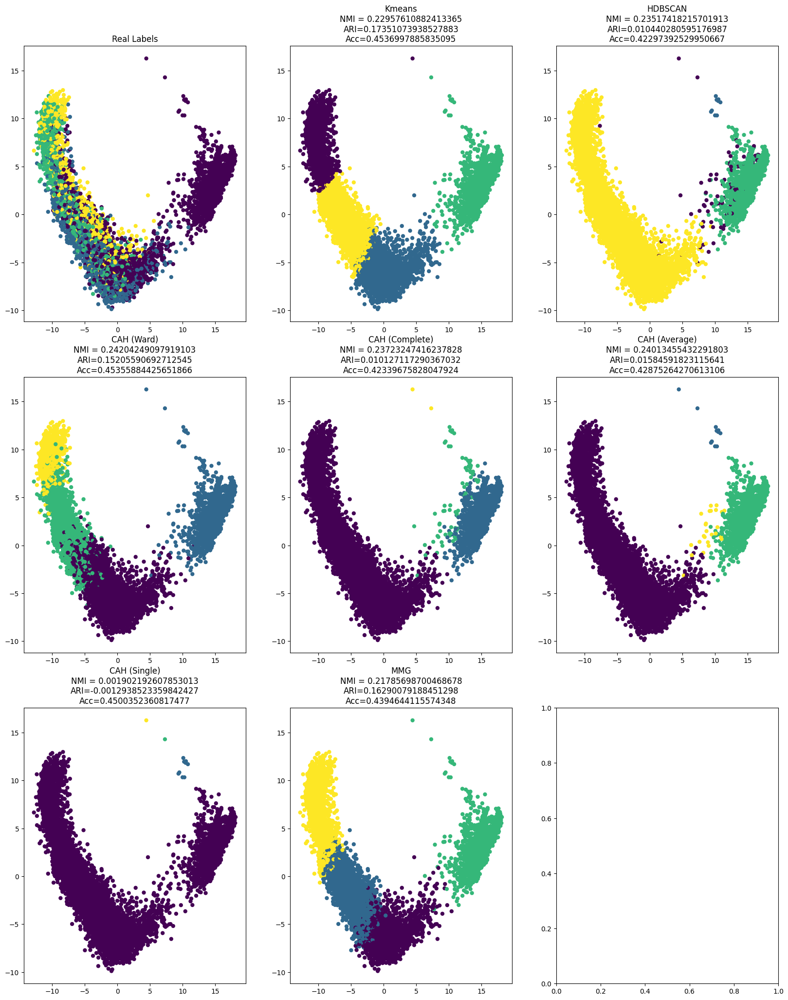

time: 20.1 s (started: 2023-05-17 21:04:33 +00:00)


In [ ]:
X_reduced = PCA(n_components=20, random_state=42).fit_transform(classic4_roberta)
results_classic4_roberta_redim['pca20'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

La superposition des classes rend le clustering difficile pour les algorithmes classiques, ce qui conduit à des performances inférieures par rapport à BERT. Tous les algorithmes affichent des résultats médiocres, avec un ARI allant de 0 à 0,17 au mieux. Ces résultats indiquent une fiabilité très limitée, notamment en ce qui concerne la précision des classifications.

### TSNE avec 2 composantes

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


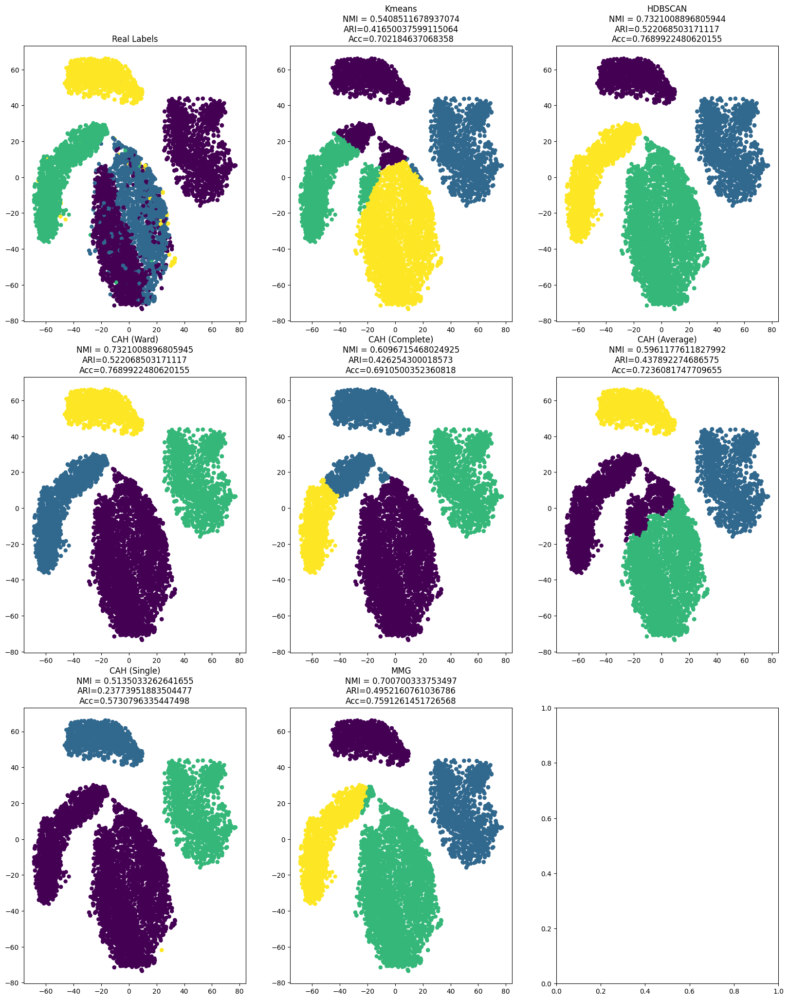

time: 2min 6s (started: 2023-05-17 21:04:53 +00:00)


In [ ]:
X_reduced_tsne = TSNE(n_components=2, random_state=42).fit_transform(classic4_roberta)
results_classic4_roberta_redim['tsne'] = run_clustering(X_reduced_tsne, k_classic4, map_labels(classic4_labels))

L'application de tSNE aux données a engendré une amélioration significative des performances de tous les modèles, permettant une meilleure séparation des classes. Cependant, il convient de noter que deux classes se chevauchent, ce qui rend leur distinction plus difficile. Les performances de Kmeans sont réduites en raison de la nature allongée des classes, tandis que CAH(Complete-Maximum) ne parvient pas à obtenir de bons résultats. En revanche, les autres modèles affichent d'excellents résultats, notamment CAH(Ward) et CAH(Average), qui convergent vers un modèle capable de classifier correctement 76,8% des articles, avec un NMI de 73,1%, le meilleur parmi tous les modèles. Comparativement, le modèle MMG obtient un NMI légèrement inférieur de 70%.


### UMAP avec 2 composantes

In [ ]:
X_reduced = UMAP(n_components=2, random_state=42).fit_transform(classic4_roberta)

time: 29 s (started: 2023-05-17 21:07:00 +00:00)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


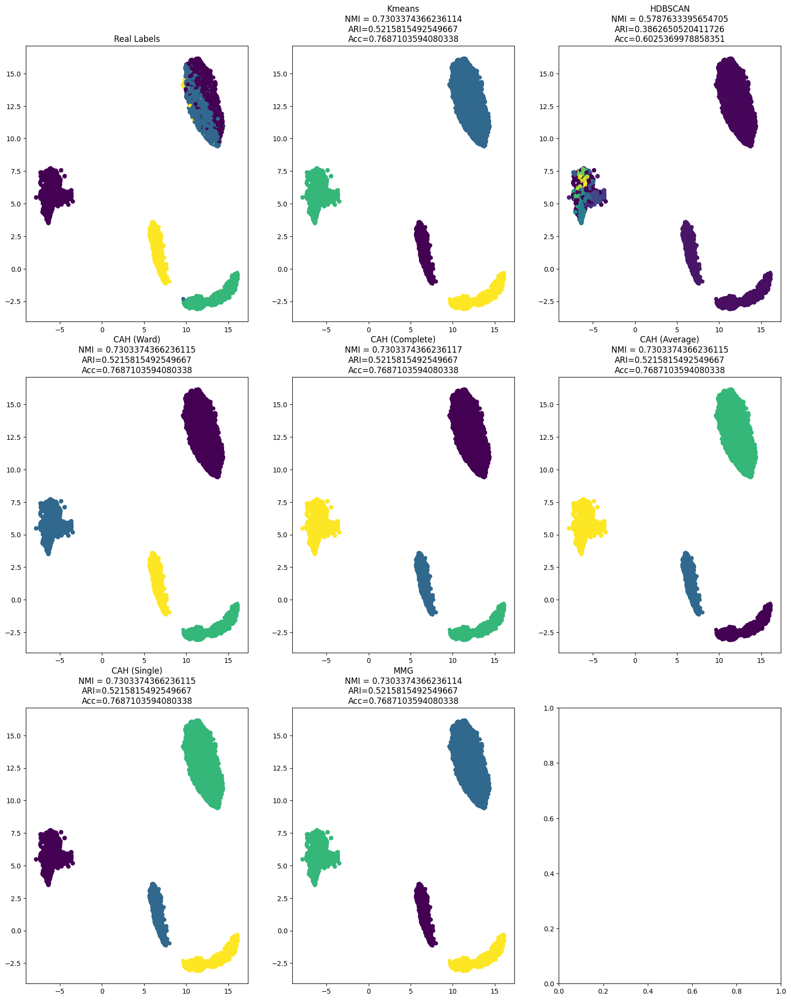

time: 10.5 s (started: 2023-05-17 21:07:29 +00:00)


In [ ]:
results_classic4_roberta_redim['umap'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

### UMAP avec 20 composantes

In [ ]:
X_reduced = UMAP(n_components=20, random_state=42).fit_transform(classic4_roberta)

time: 42.3 s (started: 2023-05-17 21:07:40 +00:00)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


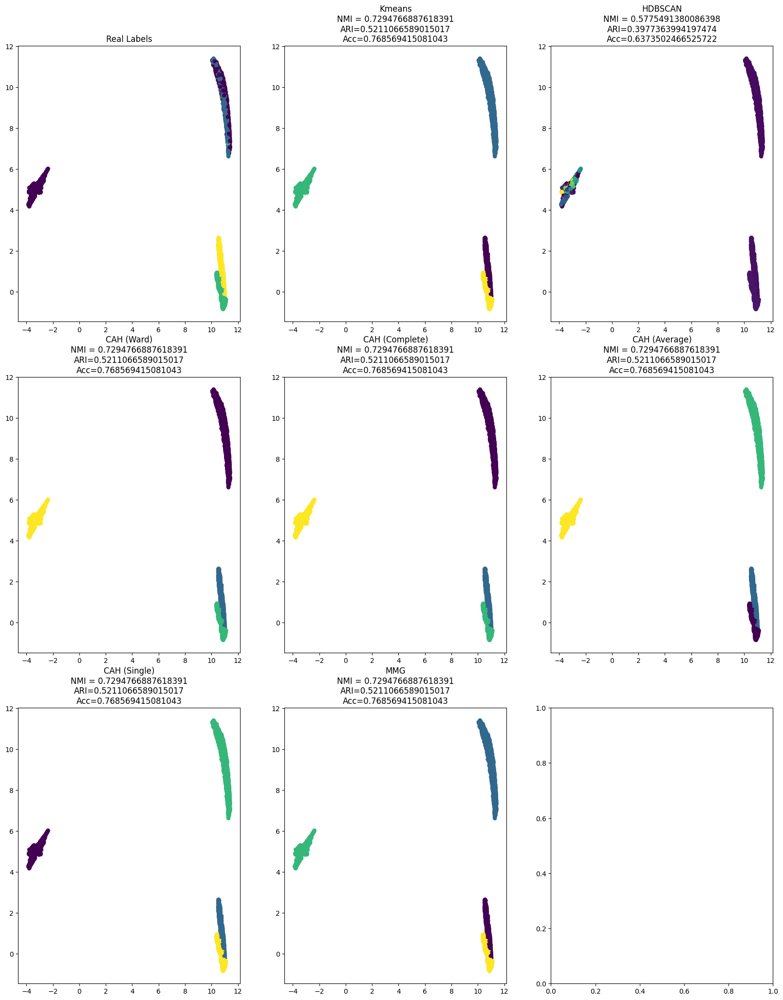

time: 14.6 s (started: 2023-05-17 21:08:22 +00:00)


In [ ]:
results_classic4_roberta_redim['umap20'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

L'application de l'UMAP aux données a entraîné une amélioration significative des performances de tous les modèles. Dans cet espace, les classes sont généralement bien séparées, à l'exception de deux classes qui se chevauchent considérablement.

Il est observé que tous les modèles, à l'exception de HDBSCAN, convergent vers un même modèle qui parvient à classifier correctement 3 sur 5 classes, mais échoue complètement à distinguer la classe chevauchée. L'accuracy  atteint 76% avec un indice ARI de 0,52.

### Autoencodeur avec 2 composantes

In [ ]:
'''n_components=2
X_reduced = autoencoder(classic4_roberta.astype("float32"), n_components, seed=42, learning_rate=1e-3)'''

'n_components=2\nX_reduced = autoencoder(classic4_roberta.astype("float32"), n_components, seed=42, learning_rate=1e-3)'

time: 7.04 ms (started: 2023-05-17 21:08:37 +00:00)


In [ ]:
'''results_classic4_roberta_redim['autoencoder'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))'''

"results_classic4_roberta_redim['autoencoder'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))"

time: 2.69 ms (started: 2023-05-17 21:08:37 +00:00)


Les résultats de l'application des méthodes de classification sur l'espace généré par l'autoencodeur révèlent plusieurs observations significatives. Tout d'abord, les classes sont plus difficiles à distinguer dans cet espace en raison de leur chevauchement. Parmi les modèles testés, CAH(Average) et MMG se distinguent avec des scores de NMI et ARI similaires. Cependant, le modèle qui se démarque le plus est CAH(Ward) avec un score de NMI de 61%. En revanche, les résultats obtenus avec UMAP sont moins compétitifs par rapport à tSNE.

## Interpretations des resultats 

In [ ]:
from copy import deepcopy
results_temp = deepcopy(results_classic4_roberta_redim)
for method in results_temp:
    for result in results_temp[method]:
        nmi, ari, acc = results_temp[method][result]
        results_temp[method][result] = {
            'nmi': nmi,
            "ari": ari,
            'acc': acc
        }

time: 1.58 ms (started: 2023-05-17 21:09:47 +00:00)


In [ ]:
results_roberta_classic4 = pd.DataFrame.from_dict({(i,j): results_temp[i][j] 
                           for i in results_temp.keys() 
                           for j in results_temp[i].keys()},
                       orient='index')

time: 42.9 ms (started: 2023-05-17 21:09:47 +00:00)


Tableau des metriques

In [ ]:
results_roberta_classic4

nmi       ari       acc
original Kmeans          0.229259  0.173318  0.453418
         CAH (Ward)      0.439223  0.320496  0.579563
         CAH (Complete)  0.228875  0.012967  0.423679
         CAH (Average)   0.239660  0.015317  0.428894
         CAH (Single)    0.000522 -0.000354  0.451163
pca2     Kmeans          0.237618  0.186080  0.468076
         HDBSCAN         0.180166 -0.080243  0.314447
         CAH (Ward)      0.237892  0.187294  0.470331
         CAH (Complete)  0.248022  0.126914  0.479634
         CAH (Average)   0.249468  0.139926  0.490063
         CAH (Single)    0.000769 -0.000106  0.451445
         MMG             0.242310  0.155163  0.452149
pca20    Kmeans          0.229576  0.173511  0.453700
         HDBSCAN         0.235174  0.010440  0.422974
         CAH (Ward)      0.242042  0.152056  0.453559
         CAH (Complete)  0.237232  0.010127  0.423397
         CAH (Average)   0.240135  0.015846  0.428753
         CAH (Single)    0.001902 -0.001294  0.450035
         MMG             0.217857  0.162901  0.439464
tsne     Kmeans          0.540851  0.416500  0.702185
         HDBSCAN         0.732101  0.522069  0.768992
         CAH (Ward)      0.732101  0.522069  0.768992
         CAH (Complete)  0.609672  0.426254  0.691050
         CAH (Average)   0.596118  0.437892  0.723608
         CAH (Single)    0.513503  0.237740  0.573080
         MMG             0.700700  0.495216  0.759126
umap     Kmeans          0.730337  0.521582  0.768710
         HDBSCAN         0.578763  0.386265  0.602537
         CAH (Ward)      0.730337  0.521582  0.768710
         CAH (Complete)  0.730337  0.521582  0.768710
         CAH (Average)   0.730337  0.521582  0.768710
         CAH (Single)    0.730337  0.521582  0.768710
         MMG             0.730337  0.521582  0.768710
umap20   Kmeans          0.729477  0.521107  0.768569
         HDBSCAN         0.577549  0.397736  0.637350
         CAH (Ward)      0.729477  0.521107  0.768569
         CAH (Complete)  0.729477  0.521107  0.768569
         CAH (Average)   0.729477  0.521107  0.768569
         CAH (Single)    0.729477  0.521107  0.768569
         MMG             0.729477  0.521107  0.768569

time: 22.5 ms (started: 2023-05-17 21:09:48 +00:00)


In [ ]:
metric = "ari"
results_roberta_classic4[results_roberta_classic4[metric] == results_roberta_classic4[metric].max()]

nmi       ari       acc
tsne HDBSCAN     0.732101  0.522069  0.768992
     CAH (Ward)  0.732101  0.522069  0.768992

time: 12.3 ms (started: 2023-05-17 21:09:48 +00:00)


In [ ]:
metric = "nmi"
results_roberta_classic4[results_roberta_classic4[metric] == results_roberta_classic4[metric].max()]

,,nmi,ari,acc
tsne,CAH (Ward),0.732101,0.522069,0.768992


time: 13.3 ms (started: 2023-05-17 21:09:48 +00:00)


In [ ]:
metric = "acc"
best_roberta_classic4 = results_roberta_classic4[results_roberta_classic4[metric] == results_roberta_classic4[metric].max()]
best_roberta_classic4

nmi       ari       acc
tsne HDBSCAN     0.732101  0.522069  0.768992
     CAH (Ward)  0.732101  0.522069  0.768992

time: 10.3 ms (started: 2023-05-17 21:09:48 +00:00)


Le modèle qui se démarque le plus est HDBSCAN en utilisant tSNE comme méthode de réduction de dimension.

In [ ]:
X_reduced_best = TSNE(n_components=2, random_state=42).fit_transform(classic4_roberta)
best_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_best).labels_

time: 1min 51s (started: 2023-05-17 21:09:48 +00:00)


In [ ]:
from wordcloud import WordCloud, STOPWORDS
def print_wordcloud(X, labels):
    temp_df = pd.DataFrame({
        "text": X,
        "labels": labels
    })
    for label in temp_df['labels'].unique():
        alltext = ' '.join(temp_df[temp_df['labels']== label]['text'])
        wordcloud = WordCloud().generate(alltext)
        # Display the generated image:
        print(f'Class: {label}')
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()
        print(f'\n')

time: 1.36 ms (started: 2023-05-17 21:11:39 +00:00)


Class: 2


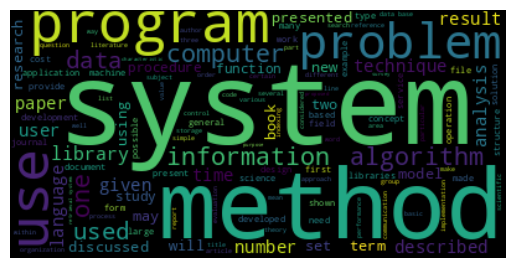



Class: 0


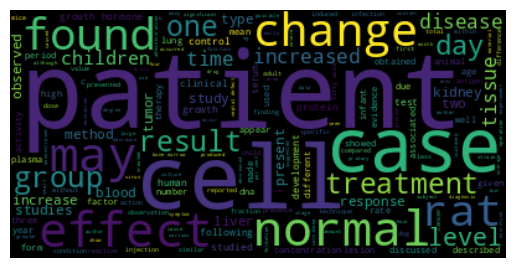



Class: 1


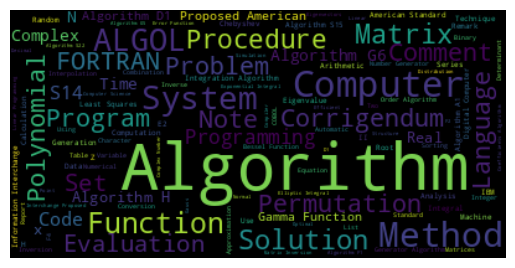



Class: 3


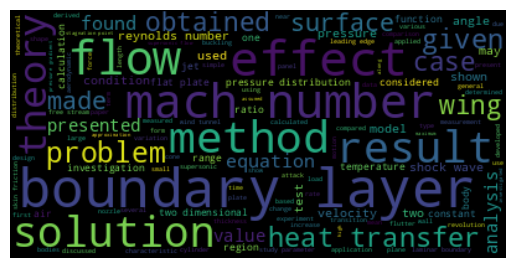



time: 6.28 s (started: 2023-05-17 21:11:39 +00:00)


In [ ]:
print_wordcloud(df['text'].values, best_labels)

Class: cacm


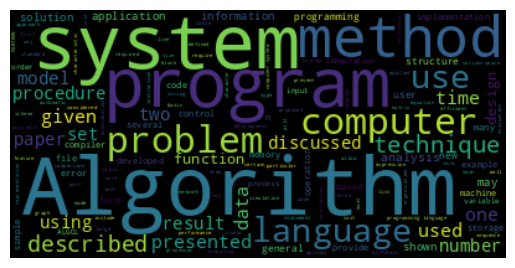



Class: cisi


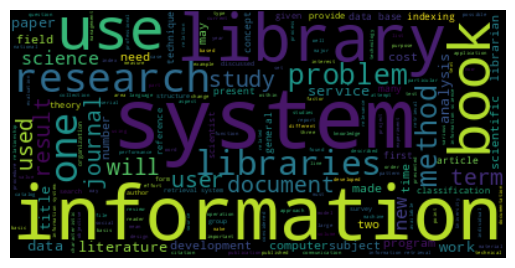



Class: med


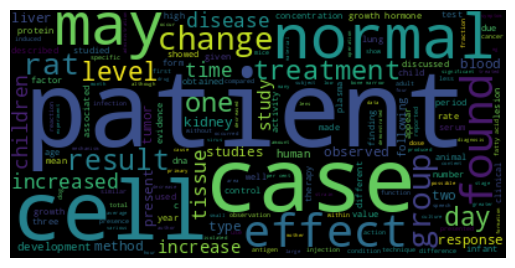



Class: cran


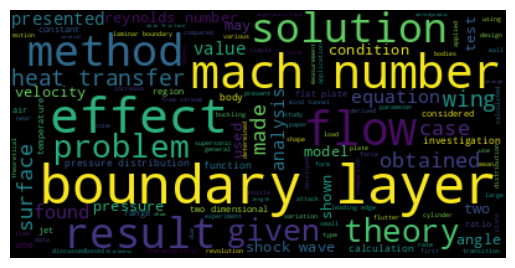



time: 6.39 s (started: 2023-05-17 21:11:45 +00:00)


In [ ]:
print_wordcloud(df['text'].values, df['label'].values)

En analysant les nuages de mots et en les comparant, nous pouvons identifier les classes prédites de la manière suivante : la classe 0 et 2 sont similaires à la classe "med", car elles partagent les mêmes termes les plus fréquents. De même, la classe 1 est similaire à la classe "cacm" et la classe 3 est similaire à la classe "cisi" en raison des termes communs qu'elles partagent. Enfin, la classe 5 est approximativement équivalente à la classe "cran" en raison de la similarité de leurs termes les plus fréquents.


# Meilleure représentation

.Les modèles sont assez similaires en termes d'accuracy avec 77%, mais le modèle utilisant Bert obtient un meilleur NMI de 74.6.3% par rapport à 73% pour celui utilisant Roberta. En ce qui concerne la réduction de dimension, la meilleure technique est TSNE avec 2 composantes pour le jeu de données classic4.